<a href="https://colab.research.google.com/github/emmacionca/data-science-course-project/blob/main/data_science_course_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# I310D Group Project

## Installing/Importing Libraries

In [ ]:
!pip install yahoofinancials

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.7/44.7 kB 992.0 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for yahoofinancials: filename=yahoofinancials-1.17-py3-none-any.whl size=31921 sha256=1b8b2a9f5dc10339f8a519c7909056c09a1cb519a70a74d6a810462cf2b2d385
  Stored in directory: /root/.cache/pip/wheels/f3/a0/02/827b28a2cd0ee24a98920f0700f34dd3b23373e046fef4c860
Successfully built yahoofinancials


In [ ]:
!pip install seaborn

In [ ]:
!pip install -U dataprep

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 52.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.5/18.5 MB 66.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 kB 14.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 58.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 58.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 36.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 764.0/764.0 kB 39.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 50.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 35.5 MB/s eta 0:00:00
  Created wheel for sqlalchemy: filename=SQLAlchemy-1.3.24-cp310-cp310-linux_x86_64.whl size=1252693 sha256=1c15b476b

In [ ]:
# libraries go here

import pandas as pd
import yfinance as yf
from yahoofinancials import YahooFinancials
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans
from math import sqrt
from dataprep.datasets import load_dataset
from dataprep.eda import create_report

## Initializing DFs, Creating Simple Visualizations

In [ ]:
sp500_df = yf.download('^GSPC',
                       start ='2020-01-21',
                       end ='2020-12-05',
                       progress=False,
).reset_index()
# importing s&p 500 2020 stock price data from yahoo finance

sp500_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2020-01-21,3321.030029,3329.790039,3316.610107,3320.790039,3320.790039,4104840000
1,2020-01-22,3330.020020,3337.770020,3320.040039,3321.750000,3321.750000,3623780000
2,2020-01-23,3315.770020,3326.879883,3301.870117,3325.540039,3325.540039,3766710000
3,2020-01-24,3333.100098,3333.179932,3281.530029,3295.469971,3295.469971,3708780000
4,2020-01-27,3247.159912,3258.850098,3234.500000,3243.629883,3243.629883,3831050000


In [ ]:
sp500_df.to_csv('sp500_2020.csv')

In [ ]:
# importing covid csv as df

covid_df = pd.read_csv('us_counties_covid19_daily.csv')

In [ ]:
covid_df.head()

,date,county,state,fips,cases,deaths
0,2020-01-21,Snohomish,Washington,53061.0,1,0.0
1,2020-01-22,Snohomish,Washington,53061.0,1,0.0
2,2020-01-23,Snohomish,Washington,53061.0,1,0.0
3,2020-01-24,Cook,Illinois,17031.0,1,0.0
4,2020-01-24,Snohomish,Washington,53061.0,1,0.0


In [ ]:
cases_df = covid_df.groupby(['date']).sum().drop('fips',axis=1).reset_index()
# summing up all counties together to get total cases by date

cases_df

<ipython-input-7-b6bf2ddadb42>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  cases_df = covid_df.groupby(['date']).sum().drop('fips',axis=1).reset_index()


,date,cases,deaths
0,2020-01-21,1,0.0
1,2020-01-22,1,0.0
2,2020-01-23,1,0.0
3,2020-01-24,2,0.0
4,2020-01-25,3,0.0
...,...,...,...
315,2020-12-01,13799415,270633.0
316,2020-12-02,13999749,273518.0
317,2020-12-03,14217106,276375.0
318,2020-12-04,14446349,279012.0


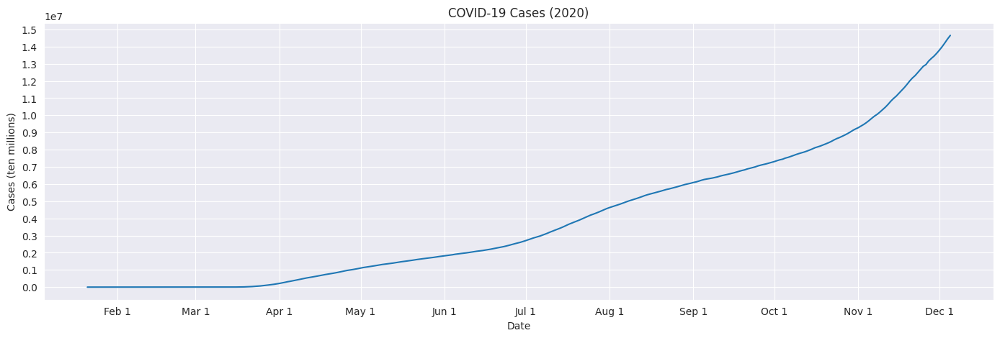

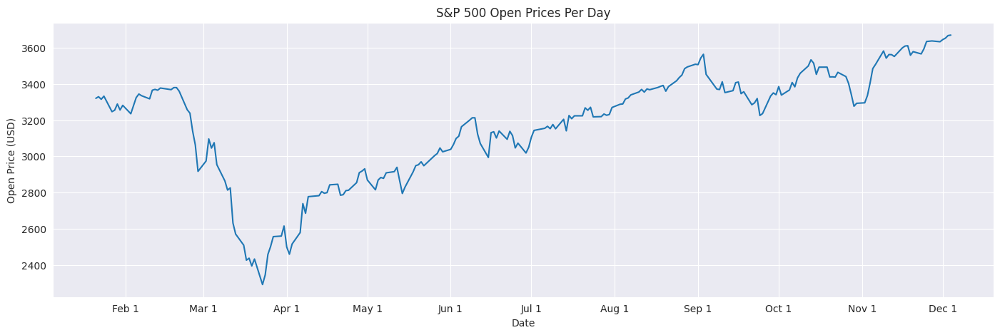

In [ ]:
# kinda messy but visualizing covid cases and open stock prices as line graphs
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(cases_df['date'], cases_df['cases'])
  ax.grid(True)
  ax.set_title('COVID-19 Cases (2020)')
  ax.set_xlabel('Date')
  ax.set_ylabel('Cases (ten millions)')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])
  ax.set_yticks(np.arange(0, 16000000, step=1000000))
# fig.savefig('covid_cases.png')

with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(sp500_df['Date'], sp500_df['Open'])
  ax.grid(True)
  ax.set_title('S&P 500 Open Prices Per Day')
  ax.set_xlabel('Date')
  ax.set_ylabel('Open Price (USD)')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

# fig.savefig('sp500_open_prices.png')

In [ ]:
# merging the two df's to test correlation

cases_df['date'] = cases_df['date'].astype('datetime64')
correlation_df = cases_df.merge(sp500_df, left_on='date', right_on='Date')
correlation_df.head()

,date,cases,deaths,Date,Open,High,Low,Close,Adj Close,Volume
0,2020-01-21,1,0.0,2020-01-21,3321.030029,3329.790039,3316.610107,3320.790039,3320.790039,4104840000
1,2020-01-22,1,0.0,2020-01-22,3330.020020,3337.770020,3320.040039,3321.750000,3321.750000,3623780000
2,2020-01-23,1,0.0,2020-01-23,3315.770020,3326.879883,3301.870117,3325.540039,3325.540039,3766710000
3,2020-01-24,2,0.0,2020-01-24,3333.100098,3333.179932,3281.530029,3295.469971,3295.469971,3708780000
4,2020-01-27,5,0.0,2020-01-27,3247.159912,3258.850098,3234.500000,3243.629883,3243.629883,3831050000


In [ ]:
# get correlation coefficient between the two

corr_co = correlation_df['cases'].corr(correlation_df['Open'])

In [ ]:
# little function to test correlation strength

def correlation_result(correlation):
  if correlation >= 0.7:
    print("There is a strong positive correlation of", correlation)
  elif 0.3 <= correlation < 0.7:
    print("There is a moderate positive correlation of", correlation)
  elif 0 <= correlation < 0.3:
    print("There is a weak positive correlation of", correlation)
  elif correlation == 0:
    print("There is no correlation")
  elif -0.3 < correlation < 0:
    print("There is a weak negative correlation of", correlation)
  elif -0.7 < correlation <= -0.3:
    print("There is a moderate negative correlation of", correlation)
  elif correlation <= -0.7:
    print("There is a strong negative correlation of", correlation)

In [ ]:
correlation_result(corr_co)

There is a strong positive correlation of 0.7337479726190048


In [ ]:
corr_co = correlation_df['deaths'].corr(correlation_df['Close'])
correlation_result(corr_co)

There is a strong positive correlation of 0.7212056777105151


In [ ]:
corr_co = correlation_df['cases'].corr(correlation_df['Volume'])
correlation_result(corr_co)

There is a moderate negative correlation of -0.32270555310639987


## Early takeaways

1. Strong positive correlation between covid-19 cases/deaths and S&P 500 stock prices at daily opening time

  * This could be for a number of reasons, namely the injection of stimulus money into the economy, people returning to work despite the lack of a vaccine or proper social distancing practices, and companies figuring out how to turn a profit during the pandemic.

2. Moderate negative correlation between number of cases and volume of sales    
  * This can probably be attributed to people being less active in terms of spending during covid, as many people found themselves in tough financial situations with the inability to work and make money, so they would need as much liquid money as possible.

## Testing Correlation Between New Cases/Deaths and Price

In [ ]:
cases_df['new_cases'] = cases_df['cases'].diff()
correlation_df['new_cases'] = correlation_df['cases'].diff()

In [ ]:
cases_df['new_deaths'] = cases_df['deaths'].diff()
correlation_df['new_deaths'] = correlation_df['deaths'].diff()

In [ ]:
cases_df

,date,cases,deaths,new_cases,new_deaths
0,2020-01-21,1,0.0,NaN,NaN
1,2020-01-22,1,0.0,0.0,0.0
2,2020-01-23,1,0.0,0.0,0.0
3,2020-01-24,2,0.0,1.0,0.0
4,2020-01-25,3,0.0,1.0,0.0
...,...,...,...,...,...
315,2020-12-01,13799415,270633.0,184286.0,2610.0
316,2020-12-02,13999749,273518.0,200334.0,2885.0
317,2020-12-03,14217106,276375.0,217357.0,2857.0
318,2020-12-04,14446349,279012.0,229243.0,2637.0


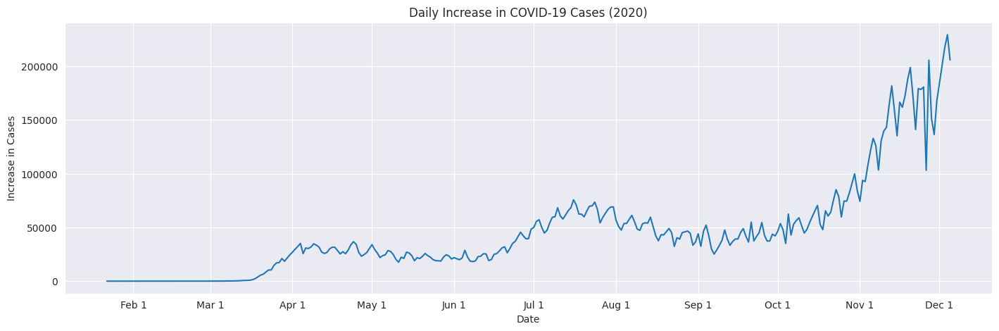

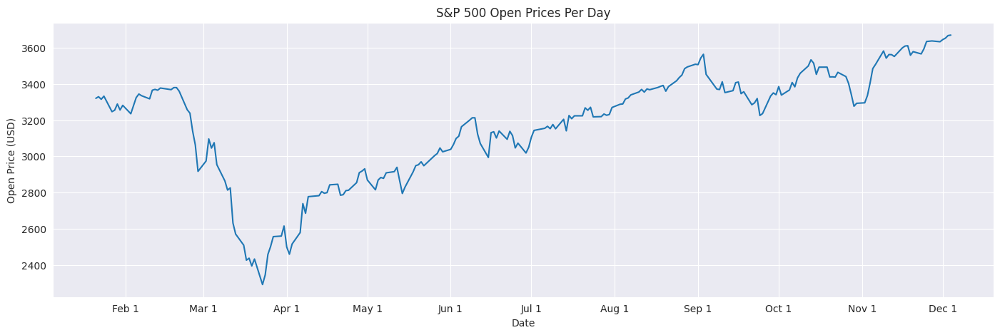

In [ ]:
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(cases_df['date'], cases_df['new_cases'])
  ax.set_title('Daily Increase in COVID-19 Cases (2020)')
  ax.set_xlabel('Date')
  ax.set_ylabel('Increase in Cases')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

# fig.savefig('covid_cases.png')
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(sp500_df['Date'], sp500_df['Open'])
  ax.set_title('S&P 500 Open Prices Per Day')
  ax.set_xlabel('Date')
  ax.set_ylabel('Open Price (USD)')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

# fig.savefig('sp500_open_prices.png')

In [ ]:
corr_co = correlation_df['new_cases'].corr(correlation_df['Open'])
correlation_result(corr_co)

There is a moderate positive correlation of 0.5821018221296921


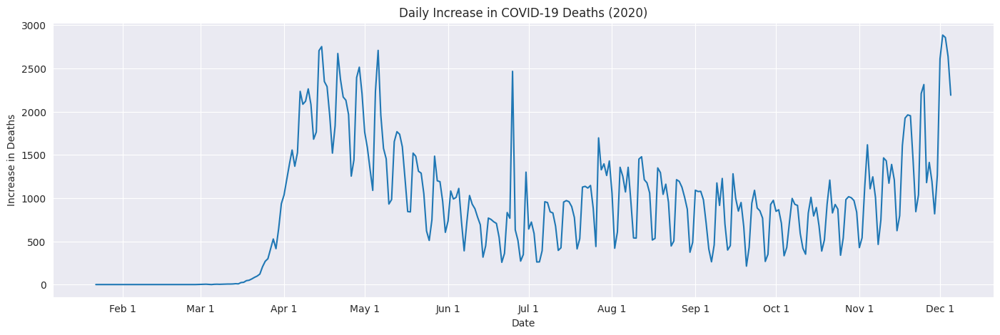

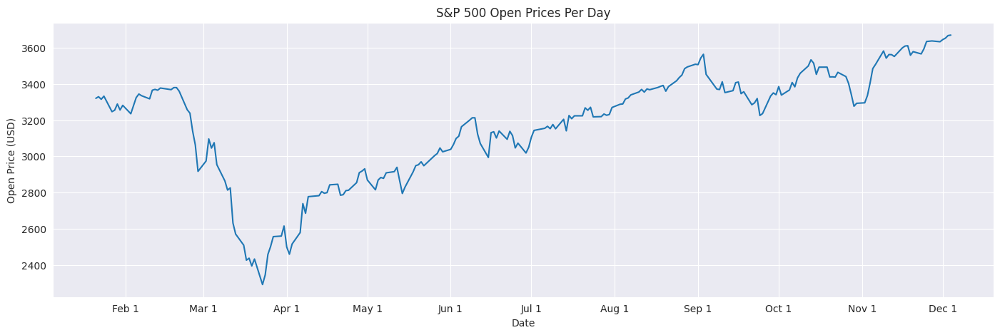

In [ ]:
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(cases_df['date'], cases_df['new_deaths'])
  ax.grid(True)
  ax.set_title('Daily Increase in COVID-19 Deaths (2020)')
  ax.set_xlabel('Date')
  ax.set_ylabel('Increase in Deaths')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

# fig.savefig('covid_cases.png')
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(sp500_df['Date'], sp500_df['Open'])
  ax.set_title('S&P 500 Open Prices Per Day')
  ax.set_xlabel('Date')
  ax.set_ylabel('Open Price (USD)')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

# fig.savefig('sp500_open_prices.png')

In [ ]:
corr_co = correlation_df['new_deaths'].corr(correlation_df['Open'])
correlation_result(corr_co)

There is a weak negative correlation of -0.017310424527052205


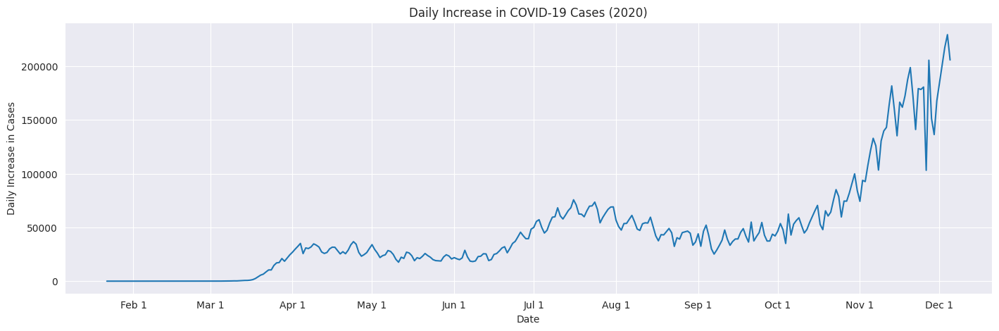

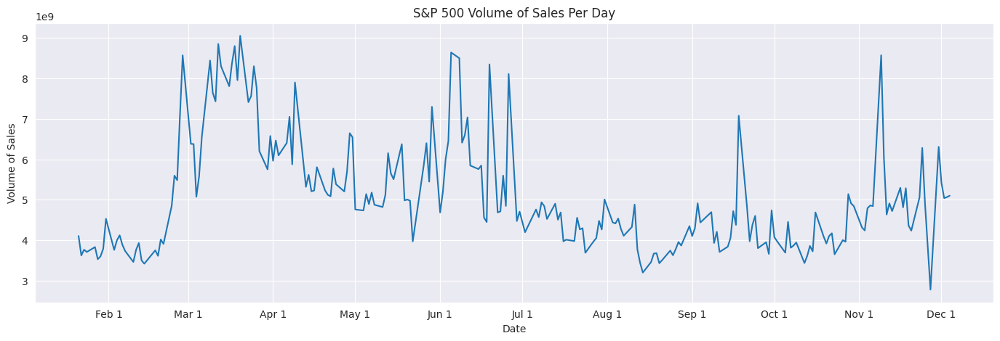

In [ ]:
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(cases_df['date'], cases_df['new_cases'])
  ax.set_title('Daily Increase in COVID-19 Cases (2020)')
  ax.set_xlabel('Date')
  ax.set_ylabel('Daily Increase in Cases')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

# fig.savefig('covid_cases.png')
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(sp500_df['Date'], sp500_df['Volume'])
  ax.set_title('S&P 500 Volume of Sales Per Day')
  ax.set_xlabel('Date')
  ax.set_ylabel('Volume of Sales')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

# fig.savefig('sp500_open_prices.png')

In [ ]:
corr_co = correlation_df['new_cases'].corr(correlation_df['Volume'])
correlation_result(corr_co)

There is a moderate negative correlation of -0.33248588702976445


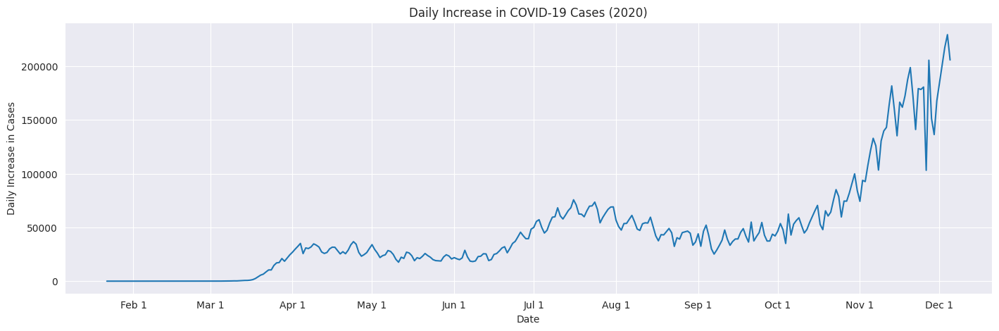

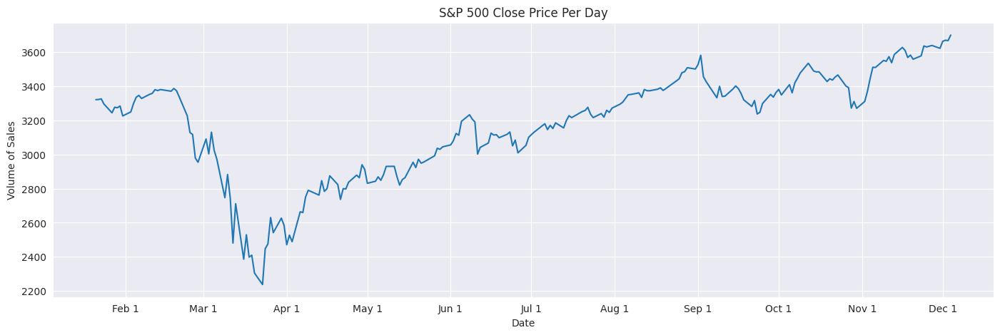

In [ ]:
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(cases_df['date'], cases_df['new_cases'])
  ax.set_title('Daily Increase in COVID-19 Cases (2020)')
  ax.set_xlabel('Date')
  ax.set_ylabel('Daily Increase in Cases')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

# fig.savefig('covid_cases.png')
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(sp500_df['Date'], sp500_df['Close'])
  ax.set_title('S&P 500 Close Price Per Day')
  ax.set_xlabel('Date')
  ax.set_ylabel('Volume of Sales')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

# fig.savefig('sp500_open_prices.png')

In [ ]:
corr_co = correlation_df['new_cases'].corr(correlation_df['Close'])
correlation_result(corr_co)

There is a moderate positive correlation of 0.4732417253757257


## Some takeaways

From these graphs and correlations we can see that there is only a moderate positive correlation with case increases stock price and there is pretty much no correlation between death increases and stock price. There is also a moderate negative correlation between volume of sales and case increases.

There also seems to be less of a linear plot when comparing case/death increases to total number of cases/deaths, which can likely be attributed to when these numbers were reported, which could vary depending on the day, because even if the cases and deaths happened on one day, they may not have been reported until another.

## K-Means Clustering & Making Scatterplots

In [ ]:
kmeans_model = KMeans(n_clusters=2, random_state=0, n_init=1)
kmeans_model.fit(sp500_df[["Close"]].to_numpy())

center = kmeans_model.cluster_centers_

print(center)

[[3349.70235109]
 [2796.24699358]]


In [ ]:
sp500_df['Close_Cluster'] = kmeans_model.labels_

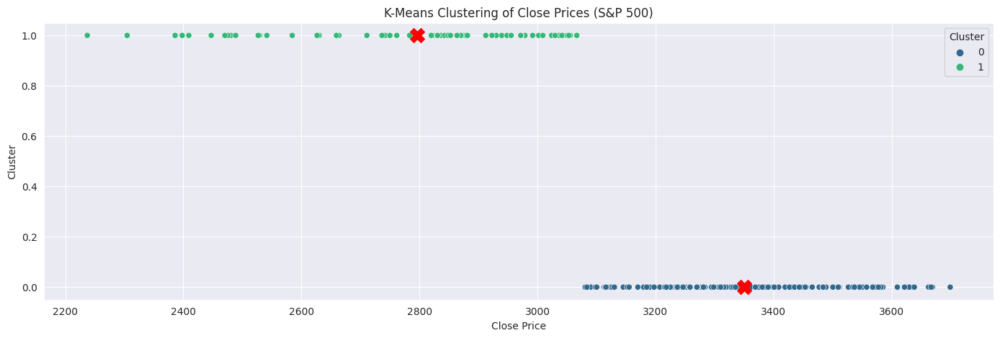

In [ ]:
with sns.axes_style('darkgrid'):
  plt.figure(figsize=(17,5))
  sns.scatterplot(x=sp500_df['Close'], y=sp500_df['Close_Cluster'], data=sp500_df, hue='Cluster', palette='viridis')
  plt.scatter(center, [0, 1], marker='X', s=200, c='red')
  plt.title('K-Means Clustering of Close Prices (S&P 500)')
  plt.xlabel('Close Price')
  plt.ylabel('Cluster')

In [ ]:
kmeans_model = KMeans(n_clusters=2, random_state=0, n_init=1)
kmeans_model.fit(sp500_df[["Volume"]].to_numpy())

center = kmeans_model.cluster_centers_

print(center)

[[4.40029399e+09]
 [7.04687491e+09]]


In [ ]:
sp500_df['Volume_Cluster'] = kmeans_model.labels_

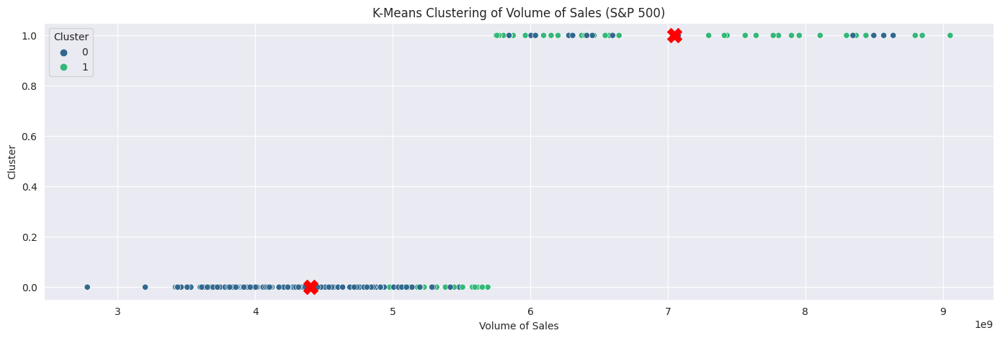

In [ ]:
with sns.axes_style('darkgrid'):
  plt.figure(figsize=(17,5))
  sns.scatterplot(x=sp500_df['Volume'], y=sp500_df['Volume_Cluster'], data=sp500_df, hue='Cluster', palette='viridis')
  plt.scatter(center, [0, 1], marker='X', s=200, c='red')
  plt.title('K-Means Clustering of Volume of Sales (S&P 500)')
  plt.xlabel('Volume of Sales')
  plt.ylabel('Cluster')

In [ ]:
kmeans_model = KMeans(n_clusters=2, random_state=0, n_init=1)
kmeans_model.fit(cases_df[["cases"]].to_numpy())

center = kmeans_model.cluster_centers_

print(center)

[[1329390.85786801]
 [8215760.74796748]]


In [ ]:
cases_df['Cluster'] = kmeans_model.labels_

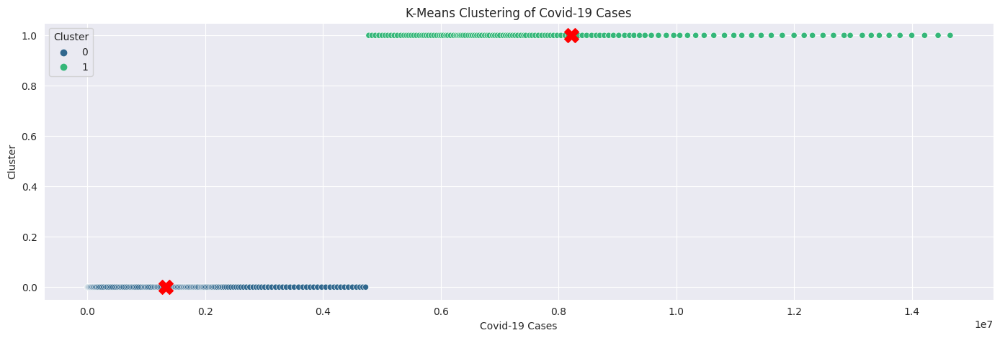

In [ ]:
with sns.axes_style('darkgrid'):
  plt.figure(figsize=(17,5))
  sns.scatterplot(x=cases_df['cases'], y=cases_df['Cluster'], data=cases_df, hue='Cluster', palette='viridis')
  plt.scatter(center, [0, 1], marker='X', s=200, c='red')
  plt.title('K-Means Clustering of Covid-19 Cases')
  plt.xlabel('Covid-19 Cases')
  plt.ylabel('Cluster')

In [ ]:
new_cases_df = cases_df.loc[1:]

In [ ]:
kmeans_model = KMeans(n_clusters=2, random_state=0, n_init=1)
kmeans_model.fit(new_cases_df[['new_cases']].to_numpy())

center = kmeans_model.cluster_centers_

print(center)

[[ 32761.33566434]
 [160069.72727273]]


In [ ]:
new_cases_df['Cluster'] = kmeans_model.labels_

<ipython-input-117-b33a445549eb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_cases_df['Cluster'] = kmeans_model.labels_


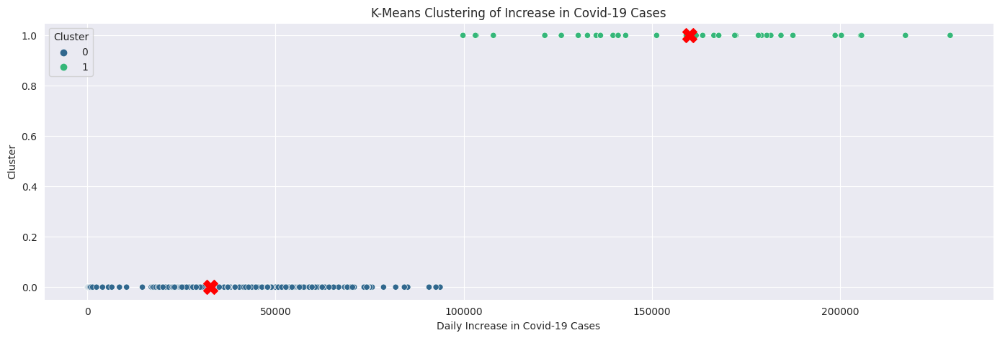

In [ ]:
with sns.axes_style('darkgrid'):
  plt.figure(figsize=(17,5))
  sns.scatterplot(x=new_cases_df['new_cases'], y=new_cases_df['Cluster'], data=new_cases_df, hue='Cluster', palette='viridis')
  plt.scatter(center, [0, 1], marker='X', s=200, c='red')
  plt.title('K-Means Clustering of Increase in Covid-19 Cases')
  plt.xlabel('Daily Increase in Covid-19 Cases')
  plt.ylabel('Cluster')

## Takeaways
* The higher cluster seems to have a more spread out variance for increase in cases, total cases, and volume of sales.
* The lower cluster seems to hold a higher variance for the S&P 500 close prices
* This could suggest that once the Covid cases spread to more people, the amount of cases became more unpredictable since different communities responded to the outbreak in different ways.
* The lower cluster for the S&P 500 holding more variance can maybe be attributed to the initial dip that can be seen at the start of covid (March/April-ish) where prices were more wild and unpredictable since no one truly knew what the effects of COVID would be on the economy.

## Exploratory Analysis Using DataPrep

Computing series-max-agg-22e0a44cee53f757ea5f8c79c461f531:   0%|          | 0/1211 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


DataPrep Report
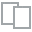
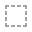
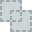
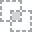
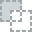
...
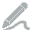
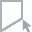
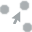
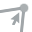
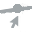

In [ ]:
report = create_report(sp500_df)
report

Computing series-max-agg-b84f81dc4274cd4f45726751e878c5b6:   0%|          | 0/819 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


DataPrep Report
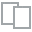
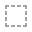
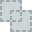
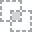
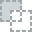
...
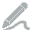
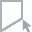
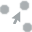
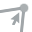
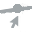

In [ ]:
report2 = create_report(cases_df)
report2

Computing series-count-agg-a3d42551af3d1a565f30b187036e8070:   2%|▏         | 44/2053 [00:00<00:09, 222.88it/s]/usr/local/lib/python3.10/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


DataPrep Report
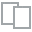
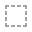
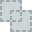
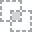
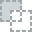
...
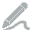
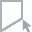
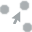
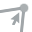
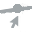

In [ ]:
report3 = create_report(correlation_df)
report3

## Looking At How Covid Affected Smaller Companies

In [ ]:
rus2000_df = yf.download('^RUT',
                       start ='2020-01-21',
                       end ='2020-12-05',
                       progress=False,
).reset_index()
# importing russell 2000 stock price data from yahoo finance

rus2000_df.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2020-01-21,1695.449951,1695.449951,1684.260010,1685.900024,1685.900024,4104840000
1,2020-01-22,1691.069946,1694.369995,1682.939941,1684.459961,1684.459961,3623780000
2,2020-01-23,1680.540039,1687.849976,1666.469971,1685.010010,1685.010010,3766710000
3,2020-01-24,1687.810059,1689.150024,1653.189941,1662.229980,1662.229980,3708780000
4,2020-01-27,1660.819946,1660.819946,1632.260010,1644.140015,1644.140015,3831050000


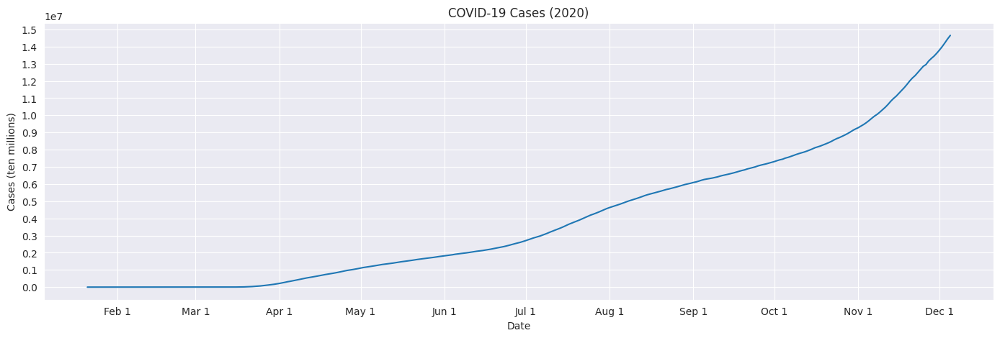

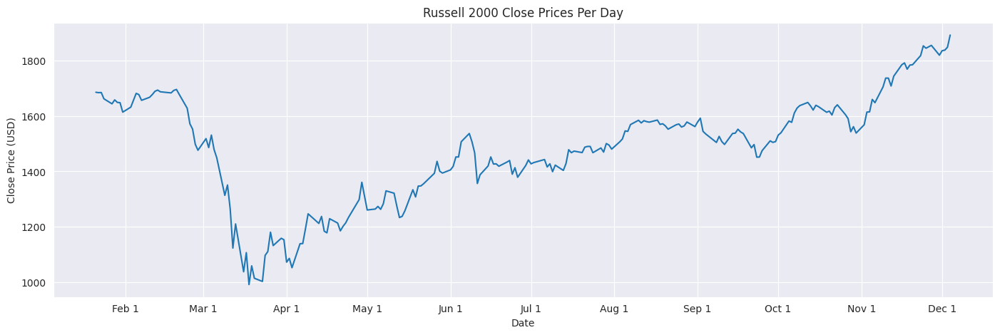

In [ ]:
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(cases_df['date'], cases_df['cases'])
  ax.grid(True)
  ax.set_title('COVID-19 Cases (2020)')
  ax.set_xlabel('Date')
  ax.set_ylabel('Cases (ten millions)')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])
  ax.set_yticks(np.arange(0, 16000000, step=1000000))

with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(rus2000_df['Date'], rus2000_df['Close'])
  ax.grid(True)
  ax.set_title('Russell 2000 Close Prices Per Day')
  ax.set_xlabel('Date')
  ax.set_ylabel('Close Price (USD)')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

In [ ]:
corr_co = correlation_df['cases'].corr(rus2000_df['Close'])
correlation_result(corr_co)

There is a moderate positive correlation of 0.6397655983274241


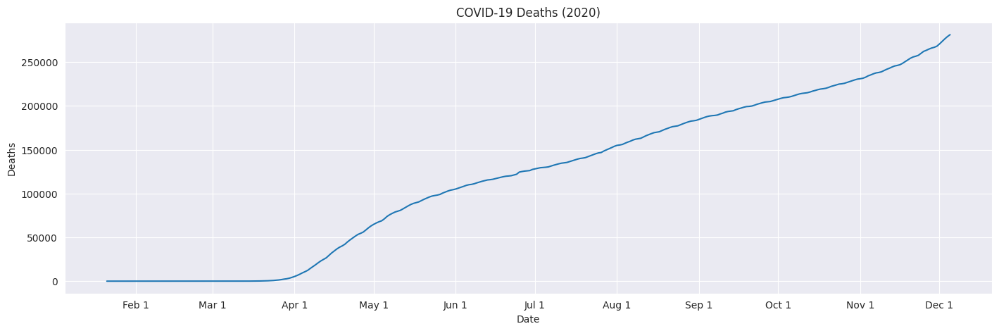

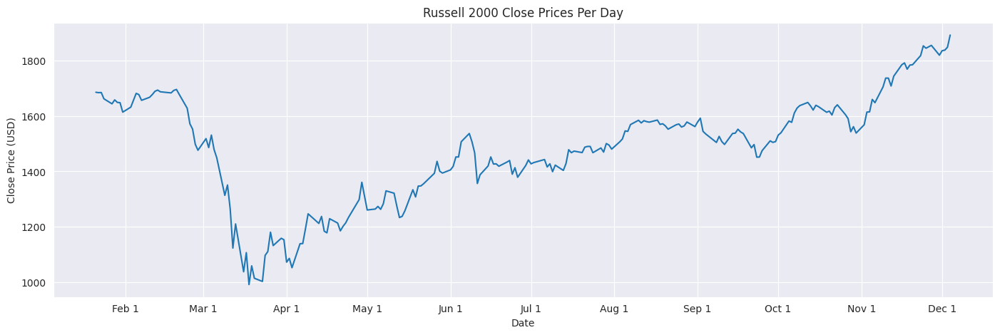

In [ ]:
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(cases_df['date'], cases_df['deaths'])
  ax.grid(True)
  ax.set_title('COVID-19 Deaths (2020)')
  ax.set_xlabel('Date')
  ax.set_ylabel('Deaths')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(rus2000_df['Date'], rus2000_df['Close'])
  ax.grid(True)
  ax.set_title('Russell 2000 Close Prices Per Day')
  ax.set_xlabel('Date')
  ax.set_ylabel('Close Price (USD)')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

In [ ]:
corr_co = correlation_df['deaths'].corr(rus2000_df['Close'])
correlation_result(corr_co)

There is a moderate positive correlation of 0.5575299180732773


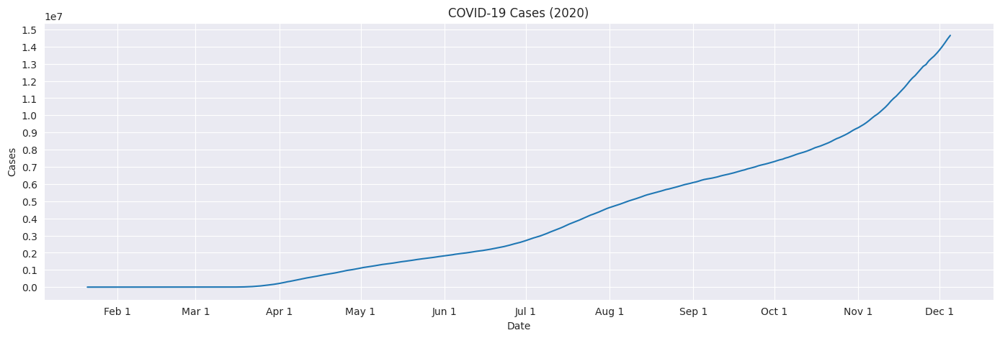

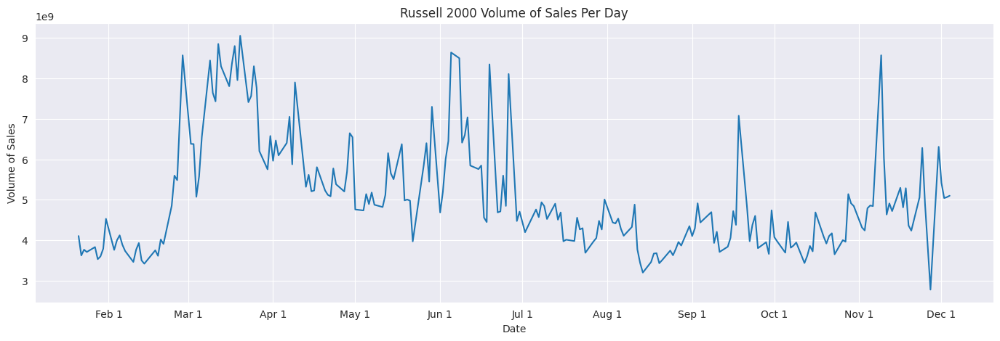

In [ ]:
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(cases_df['date'], cases_df['cases'])
  ax.grid(True)
  ax.set_title('COVID-19 Cases (2020)')
  ax.set_xlabel('Date')
  ax.set_ylabel('Cases')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])
  ax.set_yticks(np.arange(0, 16000000, step=1000000))

with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(rus2000_df['Date'], rus2000_df['Volume'])
  ax.grid(True)
  ax.set_title('Russell 2000 Volume of Sales Per Day')
  ax.set_xlabel('Date')
  ax.set_ylabel('Volume of Sales')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

In [ ]:
corr_co = correlation_df['cases'].corr(rus2000_df['Volume'])
correlation_result(corr_co)

There is a moderate negative correlation of -0.32270555310639987


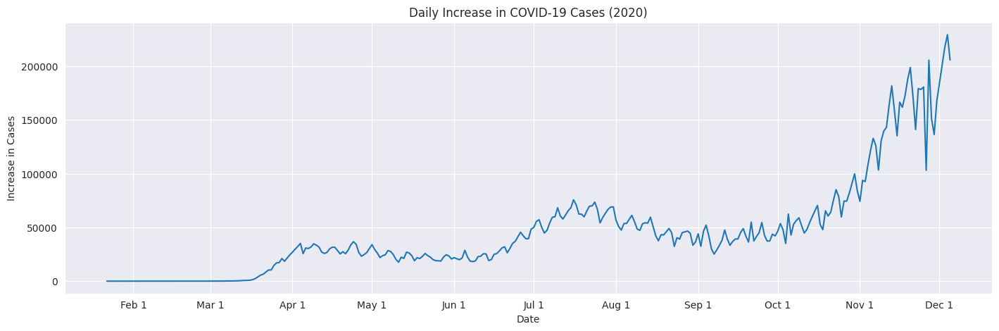

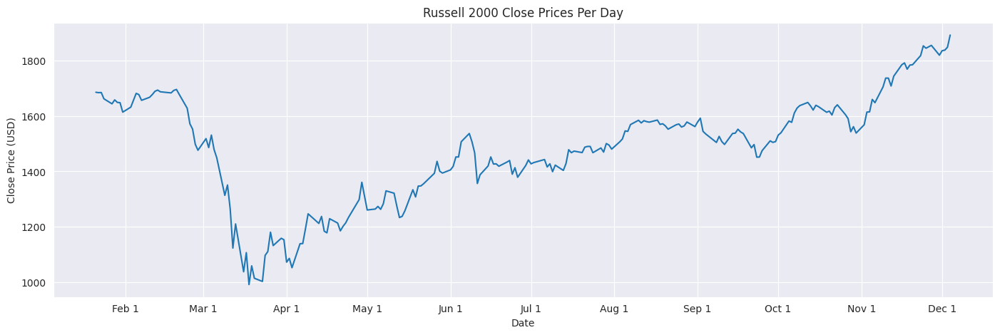

In [ ]:
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(cases_df['date'], cases_df['new_cases'])
  ax.set_title('Daily Increase in COVID-19 Cases (2020)')
  ax.set_xlabel('Date')
  ax.set_ylabel('Increase in Cases')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(sp500_df['Date'], rus2000_df['Close'])
  ax.set_title('Russell 2000 Close Prices Per Day')
  ax.set_xlabel('Date')
  ax.set_ylabel('Close Price (USD)')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

In [ ]:
corr_co = correlation_df['new_cases'].corr(rus2000_df['Close'])
correlation_result(corr_co)

There is a moderate positive correlation of 0.4450385812813678


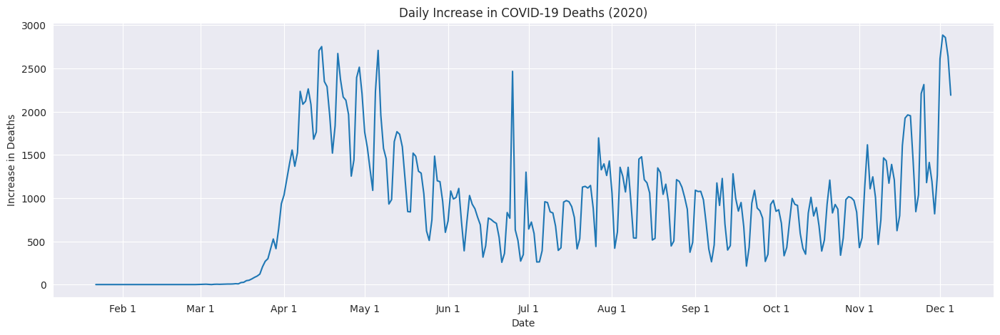

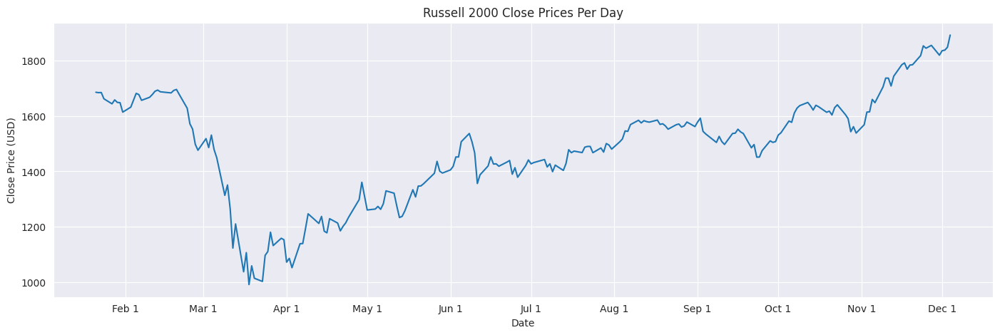

In [ ]:
with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(cases_df['date'], cases_df['new_deaths'])
  ax.set_title('Daily Increase in COVID-19 Deaths (2020)')
  ax.set_xlabel('Date')
  ax.set_ylabel('Increase in Deaths')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

with sns.axes_style('darkgrid'):
  fig, ax = plt.subplots(figsize=(17,5))
  ax.plot(sp500_df['Date'], rus2000_df['Close'])
  ax.set_title('Russell 2000 Close Prices Per Day')
  ax.set_xlabel('Date')
  ax.set_ylabel('Close Price (USD)')
  ax.set_xticks(['2020-02-01', '2020-03-01', '2020-04-01',
                '2020-05-01','2020-06-01','2020-07-01','2020-08-01',
                '2020-09-01','2020-10-01','2020-11-01','2020-12-01'],
                  ['Feb 1', 'Mar 1', 'Apr 1', 'May 1', 'Jun 1', 'Jul 1',
                  'Aug 1', 'Sep 1', 'Oct 1', 'Nov 1', 'Dec 1'])

In [ ]:
corr_co = correlation_df['new_deaths'].corr(rus2000_df['Close'])
correlation_result(corr_co)

There is a weak negative correlation of -0.10380202969696777


Computing series-max-agg-e0669f205eaa43f834c7e63002f40438:   0%|          | 0/2043 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/dask/core.py:121: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


DataPrep Report
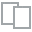
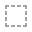
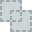
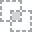
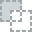
...
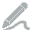
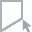
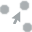
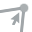
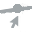

In [ ]:
rus2000_report = create_report(rus2000_df.merge(cases_df, 'right', left_on='Date', right_on='date'))
rus2000_report

In [ ]:
kmeans_model = KMeans(n_clusters=2, random_state=0, n_init=1)
kmeans_model.fit(rus2000_df[["Close"]].to_numpy())

center = kmeans_model.cluster_centers_

print(center)

[[1266.20698066]
 [1592.1848294 ]]


In [ ]:
rus2000_df['Cluster'] = kmeans_model.labels_

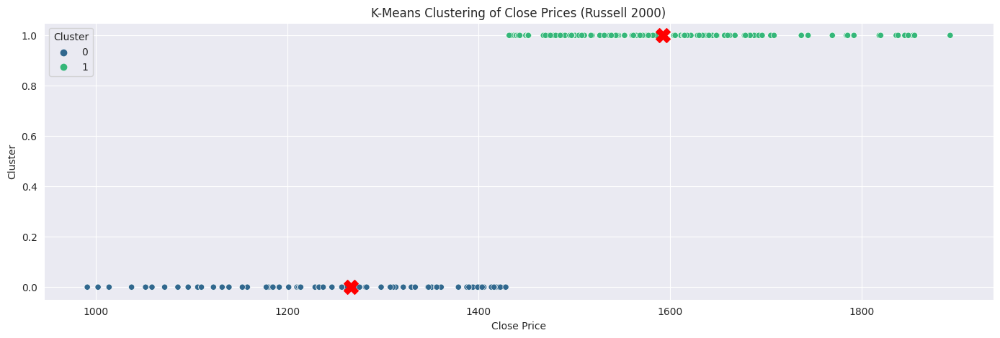

In [ ]:
with sns.axes_style('darkgrid'):
  plt.figure(figsize=(17,5))
  sns.scatterplot(x=rus2000_df['Close'], y=rus2000_df['Cluster'], data=rus2000_df, hue='Cluster', palette='viridis')
  plt.scatter(center, [0, 1], marker='X', s=200, c='red')
  plt.title('K-Means Clustering of Close Prices (Russell 2000)')
  plt.xlabel('Close Price')
  plt.ylabel('Cluster')

In [ ]:
kmeans_model = KMeans(n_clusters=2, random_state=0, n_init=1)
kmeans_model.fit(rus2000_df[["Volume"]].to_numpy())

center = kmeans_model.cluster_centers_

print(center)

[[4.40029399e+09]
 [7.04687491e+09]]


In [ ]:
rus2000_df['Cluster'] = kmeans_model.labels_

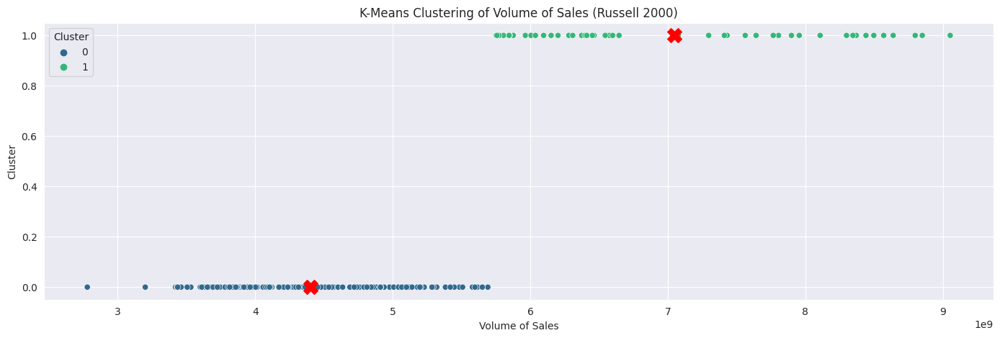

In [ ]:
with sns.axes_style('darkgrid'):
  plt.figure(figsize=(17,5))
  sns.scatterplot(x=rus2000_df['Volume'], y=rus2000_df['Cluster'], data=rus2000_df, hue='Cluster', palette='viridis')
  plt.scatter(center, [0, 1], marker='X', s=200, c='red')
  plt.title('K-Means Clustering of Volume of Sales (Russell 2000)')
  plt.xlabel('Volume of Sales')
  plt.ylabel('Cluster')

## Takeaways
* Overall, there isn't much of a difference between the correlation between S&P 500 prices and Covid-19 Cases/Deaths or Increase in Cases/Deaths and the Russell 2000's relation to these variables.
* However, the correlation between these factors is slightly weaker, showing a moderate positive correlation to cases and deaths, showing 0.64 and 0.56, respectively.
* The variance for the higher cluster seems to be more spread out for the volume of sales, while the variance for the lower cluster seems to be more spread out for the close price.

